<a href="https://colab.research.google.com/github/pachterlab/Clytia_single_cell_2020/blob/master/notebooks/cellAtlas_Analysis_KNN_NCA.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

In [2]:
!date

Thu Jul  9 21:40:47 UTC 2020


In [1]:
#Get saved merged datasets
!wget --quiet https://caltech.box.com/shared/static/jf24fsdq7ojrbwxwf3mc7pqecnrjhpem

#Raw merged data
!wget --quiet https://caltech.box.com/shared/static/0rc70zeb3jrmaa21q3honyg93pou6nbi

In [4]:
# #Unfiltered, raw starvation counts
# !wget --quiet https://caltech.box.com/shared/static/3l60szs0e9hgaax4q9dbuehgoo092xww

# #Unfiltered, raw stimulation counts
# !wget --quiet https://caltech.box.com/shared/static/cy5n9b6rdyk7v4uhvgvpkgotmchlts45

In [5]:
# #Read in filtered starved data
# !wget --quiet https://caltech.box.com/shared/static/4jr6eqg6qnnrj2c8orlf7fwo7scyj6s1
# #Original clustering 
# !wget --quiet https://caltech.box.com/shared/static/ts2i8pid7uky28kke4duyl8jwugx8z4h

# #Read in filtered stimulation data 
# !wget --quiet https://caltech.box.com/shared/static/hd36giuxz3zd933fh4bca3iqnykncro8

In [2]:
!pip install --quiet anndata
!pip install --quiet scanpy
!pip3 install --quiet leidenalg

In [3]:
import pandas as pd
import anndata
import scanpy as sc
import numpy as np
import scipy.sparse

import warnings
warnings.filterwarnings('ignore')

from sklearn.neighbors import (KNeighborsClassifier,NeighborhoodComponentsAnalysis)
from sklearn.pipeline import Pipeline
from sklearn.manifold import TSNE

import matplotlib.pyplot as plt
%matplotlib inline
sc.set_figure_params(dpi=125)

import seaborn as sns
sns.set(style="whitegrid")

####**Read in saved data**

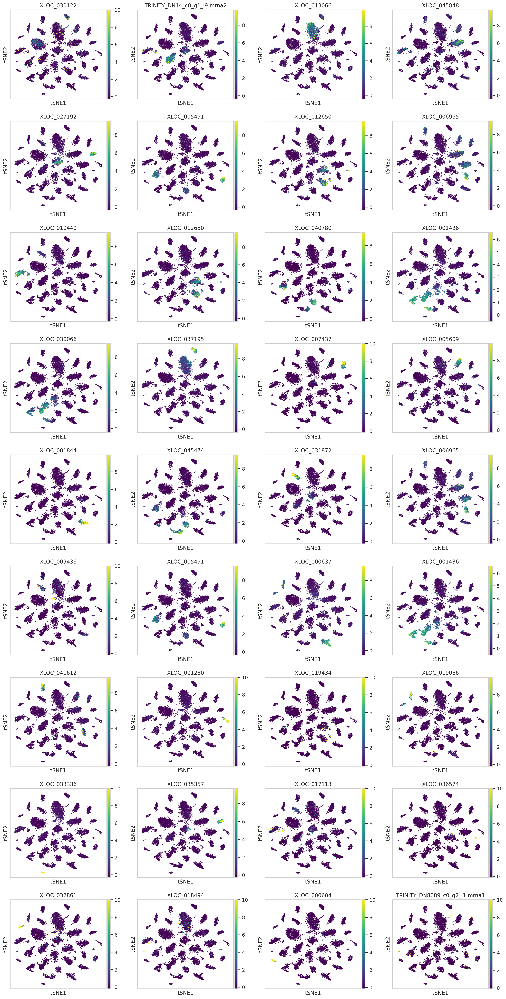

In [4]:
#Read in saved, merged data sets
overlap_combo = anndata.read("jf24fsdq7ojrbwxwf3mc7pqecnrjhpem")

#Raw data (only filtered for nonzero genes)
raw_overlap_combo = anndata.read("0rc70zeb3jrmaa21q3honyg93pou6nbi")

#Rank and extract marker genes for all clusters
#Keep top 30 genes
sc.tl.rank_genes_groups(overlap_combo, 'knn_clus', n_genes=30,method='t-test')

#Plot top marker gene for each cluster

markers = []
for i in np.unique(overlap_combo.obs['knn_clus']):
     markers += [overlap_combo.uns['rank_genes_groups']['names'][str(i)][0]]

sc.pl.tsne(overlap_combo,color=markers,color_map = 'viridis')

Read in unfiltered dataset to visualize other genes not necessarily included in the merged, filtered data

In [14]:
raw_overlap_combo

AnnData object with n_obs × n_vars = 32727 × 46716
    obs: 'batch', 'leiden_scVI', 'cell_origin'
    obsm: 'X_scVI', 'X_umap'

In [15]:
#Save obs to combo data, which contains all nonzero ('unfiltered') genes for downstream analysis/visualizations
sc.pp.filter_cells(raw_overlap_combo, min_counts=0)
sc.pp.filter_genes(raw_overlap_combo, min_counts=0)
raw_overlap_combo.obs['n_countslog']=np.log10(raw_overlap_combo.obs['n_counts'])
sc.pp.normalize_per_cell(raw_overlap_combo, counts_per_cell_after=1e5)
raw_overlap_combo.raw = sc.pp.log1p(raw_overlap_combo, copy=True)
# sc.pp.scale(raw_overlap_combo, max_value=10)


raw_overlap_combo = raw_overlap_combo[overlap_combo.obs_names,]

In [16]:
#Transfer info from embedded version
raw_overlap_combo.obs['knn_clus'] = overlap_combo.obs['knn_clus']
raw_overlap_combo.obs['cell_origin'] = overlap_combo.obs['cell_origin']
raw_overlap_combo.obsm['X_tsne'] = overlap_combo.obsm['X_tsne']

Trying to set attribute `.obs` of view, copying.


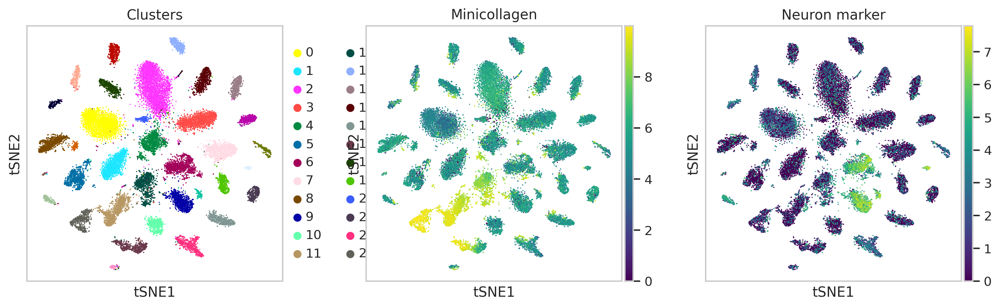

In [17]:
sc.pl.tsne(raw_overlap_combo,color=['knn_clus','XLOC_008048','XLOC_012650'],title=['Clusters','Minicollagen','Neuron marker'],color_map = 'viridis')

In [21]:
clus21

AnnData object with n_obs × n_vars = 557 × 6756
    obs: 'batch', 'condition', 'fed', 'fed_neighbor_score', 'leiden', 'louvain', 'n_counts', 'n_countslog', 'orgID', 'starved', 'knn_clus', 'cell_origin'
    var: 'n_counts-0', 'n_counts-1', 'mean', 'std'
    uns: 'cell_origin_colors', 'draw_graph', 'knn_clus_colors', 'knn_clus_sizes', 'neighbors', 'paga', 'pca', 'rank_genes_groups', 'leiden', 'leiden_colors'
    obsm: 'X_draw_graph_fa', 'X_nca', 'X_pca', 'X_tsne'
    varm: 'PCs'
    obsp: 'distances', 'connectivities'

How to sub-cluster and re-cluster

In [31]:
#Example with cluster 21
clus21 = overlap_combo[overlap_combo.obs['knn_clus'].isin([21])]
sc.pp.scale(clus21, max_value=10)

sc.tl.pca(clus21, n_comps=60)
#sc.pl.pca_variance_ratio(bus_combo, log=True)


sc.pp.neighbors(clus21,n_neighbors=40, n_pcs=30) #n_neighbors=5, n_pcs=15
sc.tl.leiden(clus21,resolution=0.5)#Clustering algorithm
sc.tl.tsne(clus21, n_pcs=30)
#sc.tl.umap(clus21)#Embedding algorithm, can use umap too


*c* argument looks like a single numeric RGB or RGBA sequence, which should be avoided as value-mapping will have precedence in case its length matches with *x* & *y*.  Please use the *color* keyword-argument or provide a 2-D array with a single row if you intend to specify the same RGB or RGBA value for all points.
*c* argument looks like a single numeric RGB or RGBA sequence, which should be avoided as value-mapping will have precedence in case its length matches with *x* & *y*.  Please use the *color* keyword-argument or provide a 2-D array with a single row if you intend to specify the same RGB or RGBA value for all points.
*c* argument looks like a single numeric RGB or RGBA sequence, which should be avoided as value-mapping will have precedence in case its length matches with *x* & *y*.  Please use the *color* keyword-argument or provide a 2-D array with a single row if you intend to specify the same RGB or RGBA value for all points.
*c* argument looks like a single numeric RGB o

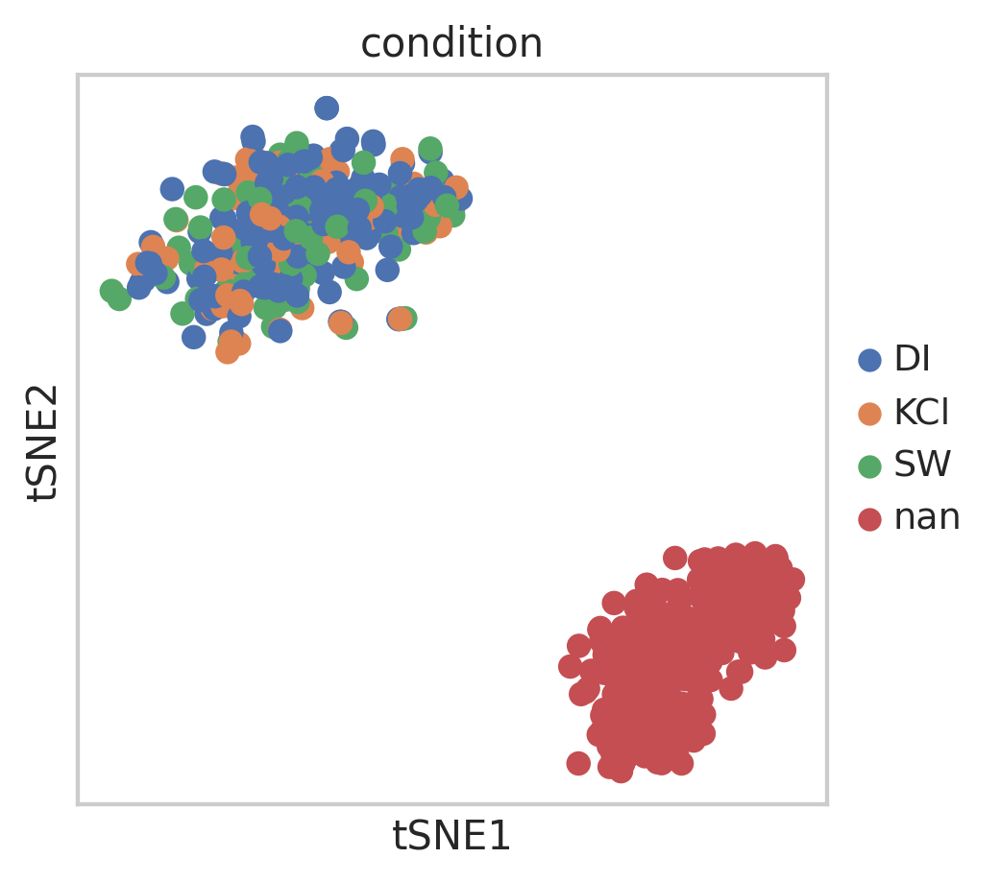

In [30]:

sc.pl.tsne(clus21, color=['condition'])

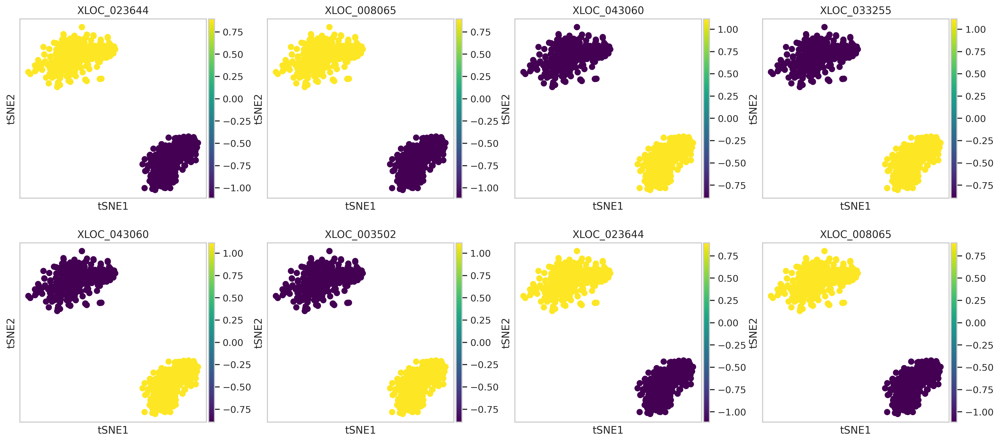

In [20]:
#Plot top marker gene for each cluster
#Keep top 30 genes
sc.tl.rank_genes_groups(clus21, 'leiden', n_genes=30,method='t-test')


markers = []
for i in np.unique(clus21.obs['leiden']):
     markers += list(clus21.uns['rank_genes_groups']['names'][str(i)][0:2])

sc.pl.tsne(clus21,color=markers,color_map = 'viridis')

In [ ]:
#Can use combo to look at unfiltered gene list
combo_clus21 = combo[clus21.obs_names,]

#Transfer info from embedded version
combo_clus21.obs['leiden'] = clus21.obs['leiden']
combo_clus21.obsm['X_tsne'] = clus21.obsm['X_tsne']

print(combo)
print(combo_clus21)